<a href="https://colab.research.google.com/github/tgloyn/DHDA_Michener/blob/main/PAT4_Team_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install Packages

In [ ]:
!pip install pycaret
!pip install pandas-profiling[notebook]
!pip install pycaret[analysis]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.4/484.4 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.4/153.4 kB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 25.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 28.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 22.2 MB/s eta 0:0

In [ ]:
from pycaret.classification import *
from pandas_profiling import ProfileReport
from imblearn.over_sampling import SMOTE
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load Dataset

In [ ]:
diabetes = pd.read_csv('https://raw.githubusercontent.com/pycaret/datasets/main/data/common/diabetes.csv')

In [ ]:
diabetes.columns = diabetes.columns.str.lower()

# EDA

In [ ]:
diabetes.head(50)

,number of times pregnant,plasma glucose concentration a 2 hours in an oral glucose tolerance test,diastolic blood pressure (mm hg),triceps skin fold thickness (mm),2-hour serum insulin (mu u/ml),body mass index (weight in kg/(height in m)^2),diabetes pedigree function,age (years),class variable
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
5,5,116,74,0,0,25.6,0.201,30,0
6,3,78,50,32,88,31.0,0.248,26,1
7,10,115,0,0,0,35.3,0.134,29,0
8,2,197,70,45,543,30.5,0.158,53,1
9,8,125,96,0,0,0.0,0.232,54,1


In [ ]:
diabetes.tail(50)

,number of times pregnant,plasma glucose concentration a 2 hours in an oral glucose tolerance test,diastolic blood pressure (mm hg),triceps skin fold thickness (mm),2-hour serum insulin (mu u/ml),body mass index (weight in kg/(height in m)^2),diabetes pedigree function,age (years),class variable
718,1,108,60,46,178,35.5,0.415,24,0
719,5,97,76,27,0,35.6,0.378,52,1
720,4,83,86,19,0,29.3,0.317,34,0
721,1,114,66,36,200,38.1,0.289,21,0
722,1,149,68,29,127,29.3,0.349,42,1
723,5,117,86,30,105,39.1,0.251,42,0
724,1,111,94,0,0,32.8,0.265,45,0
725,4,112,78,40,0,39.4,0.236,38,0
726,1,116,78,29,180,36.1,0.496,25,0
727,0,141,84,26,0,32.4,0.433,22,0


In [ ]:
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                                                                    Non-Null Count  Dtype  
---  ------                                                                    --------------  -----  
 0   number of times pregnant                                                  768 non-null    int64  
 1   plasma glucose concentration a 2 hours in an oral glucose tolerance test  768 non-null    int64  
 2   diastolic blood pressure (mm hg)                                          768 non-null    int64  
 3   triceps skin fold thickness (mm)                                          768 non-null    int64  
 4   2-hour serum insulin (mu u/ml)                                            768 non-null    int64  
 5   body mass index (weight in kg/(height in m)^2)                            768 non-null    float64
 6   diabetes pedigree function                                         

there are 9 different variables in the dataset

In [ ]:
diabetes.describe()

,number of times pregnant,plasma glucose concentration a 2 hours in an oral glucose tolerance test,diastolic blood pressure (mm hg),triceps skin fold thickness (mm),2-hour serum insulin (mu u/ml),body mass index (weight in kg/(height in m)^2),diabetes pedigree function,age (years),class variable
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


the descriptive statistics of each variable
...0 for plasma glucose concentraion, dbp, triceps skin fold thickness, bmi, 2-hr serum???

In [ ]:
diabetes.head()

,number of times pregnant,plasma glucose concentration a 2 hours in an oral glucose tolerance test,diastolic blood pressure (mm hg),triceps skin fold thickness (mm),2-hour serum insulin (mu u/ml),body mass index (weight in kg/(height in m)^2),diabetes pedigree function,age (years),class variable
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


explanation --> this function returns the first n rows for the object based on position; default is 5

<Axes: >

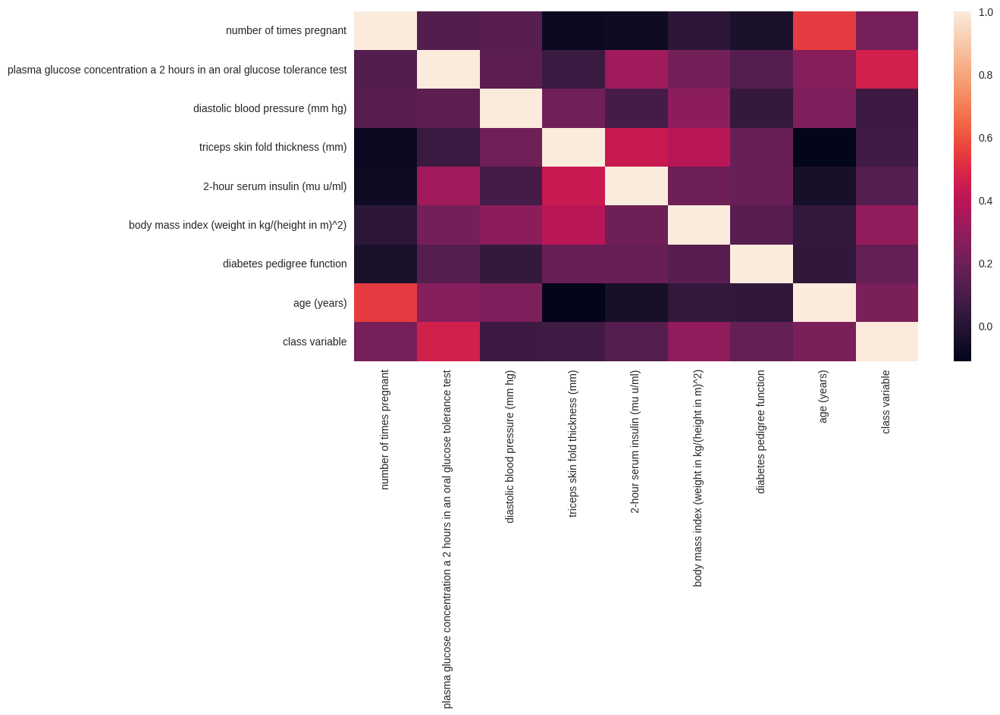

In [ ]:
plt.figure(figsize=(12,6))
sns.heatmap(diabetes.corr())

* higher correlations between age and number of times pregnant (not sure if relevant) --> we can mention it... but it might be because of something like a 70 year old has more likely chance of having 6 children compared to a 21 year old (...I mean I hope. if youre 21 and have 6 children...........ok)
* 2 hour plasma glucose correlated with class variable

<Axes: xlabel='2-hour serum insulin (mu u/ml)', ylabel='Count'>

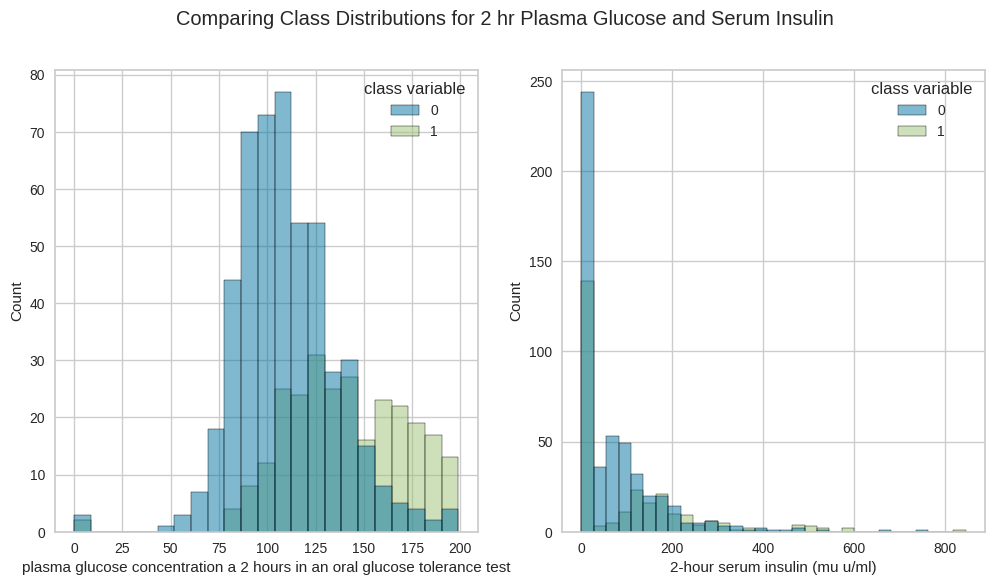

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12,6))
fig.suptitle('Comparing Class Distributions for 2 hr Plasma Glucose and Serum Insulin')
sns.histplot(ax=axes[0],data=diabetes, x='plasma glucose concentration a 2 hours in an oral glucose tolerance test', hue='class variable')
sns.histplot(ax=axes[1],data=diabetes, x='2-hour serum insulin (mu u/ml)', hue='class variable')

is a bar graph better than a scatter plot?

In [ ]:
round(diabetes['age (years)'].describe(),0)

count    768.0
mean      33.0
std       12.0
min       21.0
25%       24.0
50%       29.0
75%       41.0
max       81.0
Name: age (years), dtype: float64

Text(0.5, 1.0, 'Comparing patient age between Class 0 and Class 1')

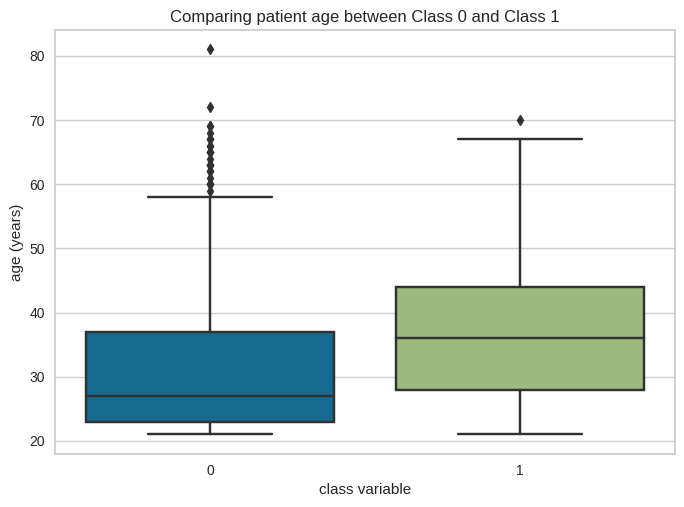

In [ ]:
sns.boxplot(data=diabetes, x='class variable',y='age (years)')
plt.title('Comparing patient age between Class 0 and Class 1')

* The dataset age range is from 21 to 81 years old, with the average age being 33.
* The class 1 subset has a box shifted higher, demonstrating a higher median age range, in addition to 25th and 75th quartiles

Do you think we need to explain the outliers and why we kept them in (I mean age doesnt matter in diabetes...or well....ok...it caaaaan.....)

In [ ]:
diabetes.isnull().sum()

number of times pregnant                                                    0
plasma glucose concentration a 2 hours in an oral glucose tolerance test    0
diastolic blood pressure (mm hg)                                            0
triceps skin fold thickness (mm)                                            0
2-hour serum insulin (mu u/ml)                                              0
body mass index (weight in kg/(height in m)^2)                              0
diabetes pedigree function                                                  0
age (years)                                                                 0
class variable                                                              0
dtype: int64

* There are no missing values in this dataset

In [ ]:
diabetes['number of times pregnant'].value_counts().sort_values()

17      1
15      1
14      2
12      9
13     10
11     11
10     24
9      28
8      38
7      45
6      50
5      57
4      68
3      75
2     103
0     111
1     135
Name: number of times pregnant, dtype: int64

<Axes: xlabel='number of times pregnant', ylabel='Density'>

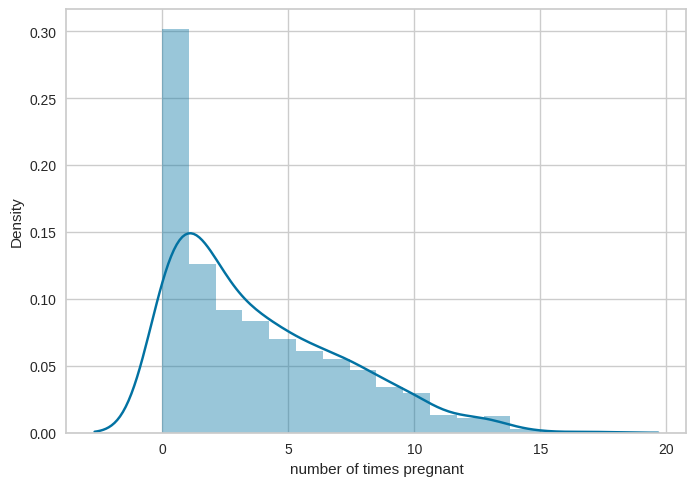

In [ ]:
sns.distplot(diabetes['number of times pregnant'])

<Axes: xlabel='class variable', ylabel='count'>

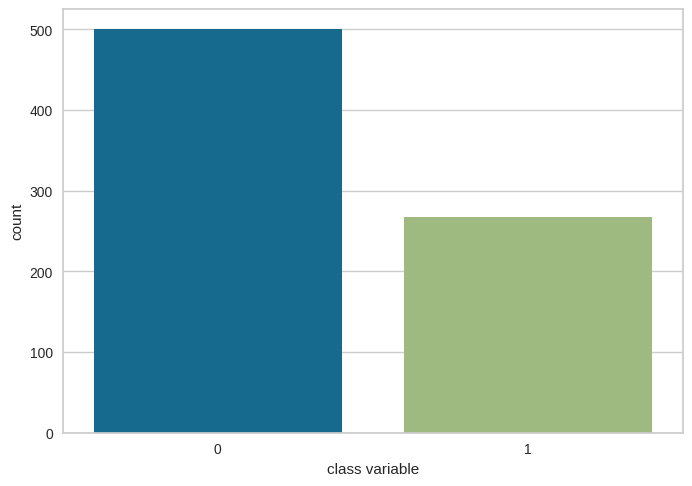

In [ ]:
sns.countplot(diabetes, x='class variable')

In [ ]:
diabetes['class variable'].value_counts()

0    500
1    268
Name: class variable, dtype: int64

In [ ]:
diab_split = 268/768
print("Percent of Diabetes: ",round(diab_split,2), "Percent of Non-diabetes: ",round(1 - diab_split,2))

Percent of Diabetes:  0.35 Percent of Non-diabetes:  0.65


<Axes: xlabel='class variable', ylabel='diabetes pedigree function'>

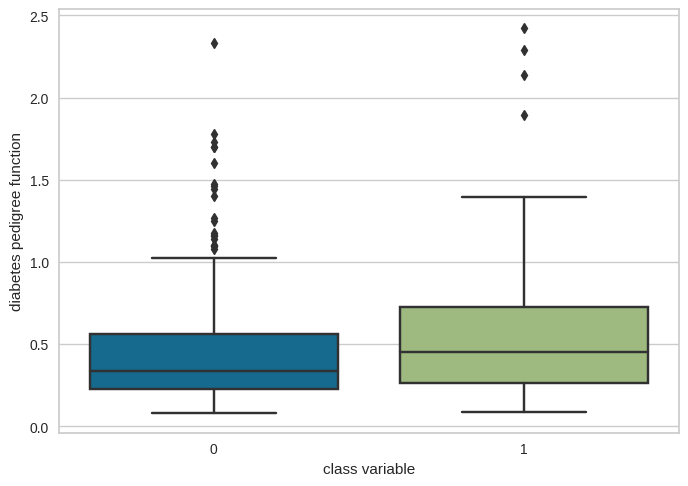

In [ ]:
sns.boxplot(data=diabetes, x = 'class variable', y = 'diabetes pedigree function')

In [ ]:
diabetes.columns

Index(['number of times pregnant',
       'plasma glucose concentration a 2 hours in an oral glucose tolerance test',
       'diastolic blood pressure (mm hg)', 'triceps skin fold thickness (mm)',
       '2-hour serum insulin (mu u/ml)',
       'body mass index (weight in kg/(height in m)^2)',
       'diabetes pedigree function', 'age (years)', 'class variable'],
      dtype='object')

In [ ]:
diabetes[diabetes['2-hour serum insulin (mu u/ml)'] == 0]['class variable'].value_counts()

0    236
1    138
Name: class variable, dtype: int64

In [ ]:
236/(236+138)

0.6310160427807486

Zero value within serum insulin distributed 63% in class 0 and 37% in class 1

In [ ]:
# Mean serum insulin per class with zeros
print('Mean Serum insulin with Class 1:', diabetes[diabetes['class variable'] == 1]['2-hour serum insulin (mu u/ml)'].mean())
print('Mean Serum insulin with Class 0:', diabetes[diabetes['class variable'] == 0]['2-hour serum insulin (mu u/ml)'].mean())
print('Tricep with Class 1:', diabetes[diabetes['class variable'] == 1]['triceps skin fold thickness (mm)'].mean())
print('Tricep with Class 0:', diabetes[diabetes['class variable'] == 0]['triceps skin fold thickness (mm)'].mean())

Mean Serum insulin with Class 1: 100.33582089552239
Mean Serum insulin with Class 0: 68.792
Tricep with Class 1: 22.16417910447761
Tricep with Class 0: 19.664


In [ ]:
diabetes3 = diabetes.copy()

In [ ]:
diabetes3['2-hour serum insulin (mu u/ml)'] = np.where(diabetes['2-hour serum insulin (mu u/ml)'] == 0, np.nan, diabetes['2-hour serum insulin (mu u/ml)'])
diabetes3['triceps skin fold thickness (mm)'] = np.where(diabetes['triceps skin fold thickness (mm)'] == 0, np.nan, diabetes['triceps skin fold thickness (mm)'])

In [ ]:
# Mean serum insulin per class WITHOUT zeros
print('Mean Serum insulin with Class 1:', diabetes3[diabetes3['class variable'] == 1]['2-hour serum insulin (mu u/ml)'].mean())
print('Mean Serum insulin with Class 0:', diabetes3[diabetes3['class variable'] == 0]['2-hour serum insulin (mu u/ml)'].mean())
print('Tricep with Class 1:', diabetes3[diabetes3['class variable'] == 1]['triceps skin fold thickness (mm)'].mean())
print('Tricep with Class 0:', diabetes3[diabetes3['class variable'] == 0]['triceps skin fold thickness (mm)'].mean())

Mean Serum insulin with Class 1: 206.84615384615384
Mean Serum insulin with Class 0: 130.28787878787878
Tricep with Class 1: 33.0
Tricep with Class 0: 27.235457063711912


<Axes: xlabel='2-hour serum insulin (mu u/ml)', ylabel='Density'>

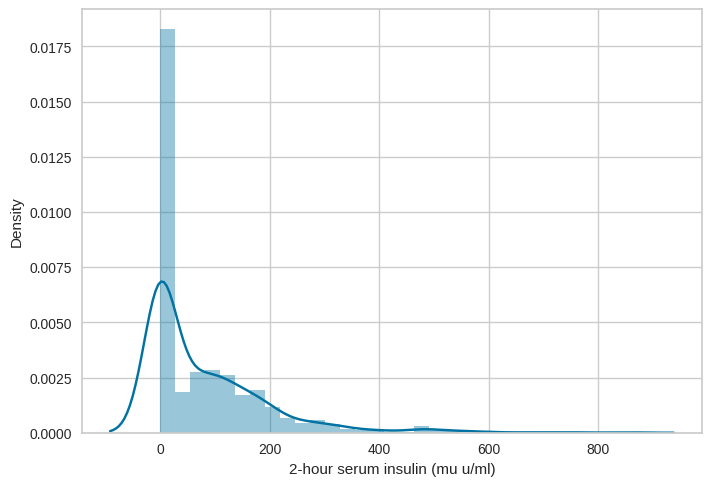

In [ ]:
sns.distplot(diabetes['2-hour serum insulin (mu u/ml)'])

# Pandas Profiling

In [ ]:
profile = ProfileReport(diabetes)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Preprocessing

In [ ]:
diabetes.columns

Index(['number of times pregnant',
       'plasma glucose concentration a 2 hours in an oral glucose tolerance test',
       'diastolic blood pressure (mm hg)', 'triceps skin fold thickness (mm)',
       '2-hour serum insulin (mu u/ml)',
       'body mass index (weight in kg/(height in m)^2)',
       'diabetes pedigree function', 'age (years)', 'class variable'],
      dtype='object')

In [ ]:
diabetes['body mass index (weight in kg/(height in m)^2)'] = np.where(diabetes['body mass index (weight in kg/(height in m)^2)'] == 0, np.nan, diabetes['body mass index (weight in kg/(height in m)^2)'])
diabetes['diastolic blood pressure (mm hg)'] = np.where(diabetes['diastolic blood pressure (mm hg)'] == 0, np.nan, diabetes['diastolic blood pressure (mm hg)'])
diabetes['plasma glucose concentration a 2 hours in an oral glucose tolerance test'] = np.where(diabetes['plasma glucose concentration a 2 hours in an oral glucose tolerance test'] == 0, np.nan, diabetes['plasma glucose concentration a 2 hours in an oral glucose tolerance test'])
diabetes['2-hour serum insulin (mu u/ml)'] = np.where(diabetes['2-hour serum insulin (mu u/ml)'] == 0, np.nan, diabetes['2-hour serum insulin (mu u/ml)'])
diabetes['triceps skin fold thickness (mm)'] = np.where(diabetes['triceps skin fold thickness (mm)'] == 0, np.nan, diabetes['triceps skin fold thickness (mm)'])

In [ ]:
diab_model1 = setup(data = diabetes, target = 'class variable', train_size = 0.7, numeric_imputation= 'knn', normalize=True, session_id = 1)

,Description,Value
0,Session id,1
1,Target,class variable
2,Target type,Binary
3,Original data shape,"(768, 9)"
4,Transformed data shape,"(768, 9)"
5,Transformed train set shape,"(537, 9)"
6,Transformed test set shape,"(231, 9)"
7,Numeric features,8
8,Rows with missing values,49.0%
9,Preprocess,True


In [ ]:
diab_model2 = setup(data = diabetes, target = 'class variable', train_size = 0.8, numeric_imputation= 'knn', normalize=True, session_id = 2)

,Description,Value
0,Session id,2
1,Target,class variable
2,Target type,Binary
3,Original data shape,"(768, 9)"
4,Transformed data shape,"(768, 9)"
5,Transformed train set shape,"(614, 9)"
6,Transformed test set shape,"(154, 9)"
7,Numeric features,8
8,Rows with missing values,49.0%
9,Preprocess,True


## Preprocessing using simulated data

In [ ]:
sim_diab_model1 = setup(data = diabetes, target = 'class variable', train_size = 0.7, numeric_imputation= 'knn', fix_imbalance = True, normalize=True, session_id = 3)

,Description,Value
0,Session id,3
1,Target,class variable
2,Target type,Binary
3,Original data shape,"(768, 9)"
4,Transformed data shape,"(931, 9)"
5,Transformed train set shape,"(700, 9)"
6,Transformed test set shape,"(231, 9)"
7,Numeric features,8
8,Rows with missing values,49.0%
9,Preprocess,True


In [ ]:
sim_diab_model2 = setup(data = diabetes, target = 'class variable', train_size = 0.8, numeric_imputation= 'knn', fix_imbalance = True, normalize=True, session_id = 4)

,Description,Value
0,Session id,4
1,Target,class variable
2,Target type,Binary
3,Original data shape,"(768, 9)"
4,Transformed data shape,"(954, 9)"
5,Transformed train set shape,"(800, 9)"
6,Transformed test set shape,"(154, 9)"
7,Numeric features,8
8,Rows with missing values,49.0%
9,Preprocess,True


# Comparing Models

## Original dataset with train-test split of 70/30

---



In [ ]:
best_diab_model1 = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.7849,0.8396,0.7242,0.6817,0.6989,0.5327,0.5365,0.6400
lda,Linear Discriminant Analysis,0.7786,0.8451,0.7197,0.6707,0.6913,0.5195,0.5234,0.1190
ridge,Ridge Classifier,0.7753,0.0000,0.7294,0.6584,0.6887,0.5142,0.5193,0.1880
xgboost,Extreme Gradient Boosting,0.7719,0.8246,0.6965,0.6683,0.6777,0.5025,0.5062,0.2510
gbc,Gradient Boosting Classifier,0.7685,0.8449,0.7236,0.6593,0.6834,0.5031,0.5106,0.8340
qda,Quadratic Discriminant Analysis,0.7672,0.8164,0.6870,0.6611,0.6697,0.4907,0.4948,0.1150
lr,Logistic Regression,0.7639,0.8454,0.7245,0.6420,0.6787,0.4934,0.4980,0.5600
et,Extra Trees Classifier,0.7638,0.8407,0.6870,0.6512,0.6657,0.4839,0.4871,0.5190
lightgbm,Light Gradient Boosting Machine,0.7623,0.8289,0.6968,0.6501,0.6701,0.4854,0.4883,0.6410
nb,Naive Bayes,0.7493,0.8196,0.6874,0.6284,0.6558,0.4594,0.4613,0.1110


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

## Original dataset with train-test split of 80/20



In [ ]:
best_diab_model2 = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.7802,0.8419,0.7102,0.6759,0.6897,0.5201,0.5235,0.6330
ridge,Ridge Classifier,0.7769,0.0000,0.7104,0.6715,0.6855,0.5140,0.5189,0.1480
lda,Linear Discriminant Analysis,0.7753,0.8417,0.7197,0.6674,0.6883,0.5138,0.5190,0.2400
rf,Random Forest Classifier,0.7703,0.8413,0.7143,0.6609,0.6832,0.5041,0.5084,0.9100
lightgbm,Light Gradient Boosting Machine,0.7687,0.8295,0.6827,0.6682,0.6696,0.4932,0.4978,0.2470
gbc,Gradient Boosting Classifier,0.7670,0.8417,0.7474,0.6478,0.6900,0.5058,0.5136,0.5860
xgboost,Extreme Gradient Boosting,0.7670,0.8241,0.6868,0.6617,0.6686,0.4903,0.4953,0.2600
lr,Logistic Regression,0.7590,0.8433,0.7478,0.6324,0.6825,0.4910,0.4987,0.1290
qda,Quadratic Discriminant Analysis,0.7589,0.8138,0.6634,0.6546,0.6564,0.4713,0.4735,0.1300
nb,Naive Bayes,0.7477,0.8270,0.6920,0.6244,0.6557,0.4575,0.4598,0.1230


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

## Simulated dataset with train-test split of 70/30


In [ ]:
sim_best_diab_model1 = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.7818,0.0000,0.7292,0.6746,0.6964,0.5274,0.5328,0.1070
gbc,Gradient Boosting Classifier,0.7783,0.8404,0.7424,0.6650,0.6993,0.5251,0.5295,0.4380
et,Extra Trees Classifier,0.7736,0.8450,0.7335,0.6627,0.6930,0.5152,0.5203,0.9370
rf,Random Forest Classifier,0.7735,0.8433,0.6955,0.6681,0.6774,0.5037,0.5079,0.8090
qda,Quadratic Discriminant Analysis,0.7702,0.8155,0.6682,0.6735,0.6673,0.4927,0.4954,0.2490
xgboost,Extreme Gradient Boosting,0.7686,0.8261,0.6961,0.6563,0.6721,0.4943,0.4979,0.2590
lda,Linear Discriminant Analysis,0.7670,0.8428,0.7245,0.6484,0.6805,0.4989,0.5045,0.1340
lightgbm,Light Gradient Boosting Machine,0.7670,0.8304,0.7009,0.6571,0.6751,0.4947,0.4980,0.2540
lr,Logistic Regression,0.7655,0.8422,0.7290,0.6443,0.6811,0.4971,0.5029,0.2530
ada,Ada Boost Classifier,0.7474,0.8281,0.6686,0.6372,0.6465,0.4523,0.4569,0.3640


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

## Simulated dataset with train-test split of 80/20


In [ ]:
sim_best_diab_model2 = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.7768,0.8378,0.7002,0.6761,0.6847,0.5125,0.5160,0.7450
qda,Quadratic Discriminant Analysis,0.7752,0.8206,0.6818,0.6796,0.6780,0.5058,0.5082,0.1460
ridge,Ridge Classifier,0.7736,0.0000,0.7294,0.6581,0.6876,0.5118,0.5176,0.1170
xgboost,Extreme Gradient Boosting,0.7735,0.8300,0.7195,0.6614,0.6862,0.5102,0.5143,0.2720
lda,Linear Discriminant Analysis,0.7720,0.8438,0.7152,0.6594,0.6819,0.5055,0.5106,0.2590
rf,Random Forest Classifier,0.7719,0.8416,0.7095,0.6612,0.6798,0.5036,0.5090,1.0040
gbc,Gradient Boosting Classifier,0.7719,0.8446,0.7240,0.6585,0.6855,0.5080,0.5133,0.5050
lr,Logistic Regression,0.7672,0.8410,0.7335,0.6492,0.6859,0.5025,0.5081,0.2660
lightgbm,Light Gradient Boosting Machine,0.7670,0.8304,0.6864,0.6567,0.6686,0.4895,0.4924,0.2580
nb,Naive Bayes,0.7444,0.8219,0.6874,0.6196,0.6512,0.4504,0.4525,0.1390


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [ ]:
print(sim_best_diab_model1)

RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, positive=False, random_state=4, solver='auto',
                tol=0.0001)


# Model Tuning

In [ ]:
tuned_sim_best_model2 = tune_model(sim_best_diab_model2, n_iter=10)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8704,0.9053,0.8947,0.7727,0.8293,0.7257,0.7308
1,0.8333,0.9173,0.6316,0.8571,0.7273,0.6112,0.6260
2,0.7593,0.8496,0.8421,0.6154,0.7111,0.5132,0.5318
3,0.7037,0.7714,0.7368,0.5600,0.6364,0.3941,0.4047
4,0.7037,0.8165,0.7368,0.5600,0.6364,0.3941,0.4047
5,0.8148,0.8767,0.8421,0.6957,0.7619,0.6126,0.6201
6,0.7407,0.8316,0.6842,0.6190,0.6500,0.4449,0.4463
7,0.8491,0.8698,0.7222,0.8125,0.7647,0.6542,0.6566
8,0.7358,0.8159,0.7778,0.5833,0.6667,0.4552,0.4682


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [ ]:
sim_tuned_best_model3 = tune_model(sim_best_diab_model3, n_iter=20)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8148,0.8887,0.7895,0.7143,0.7500,0.6035,0.6054
1,0.8519,0.8977,0.7368,0.8235,0.7778,0.6672,0.6695
2,0.7593,0.8797,0.8421,0.6154,0.7111,0.5132,0.5318
3,0.7037,0.8000,0.7368,0.5600,0.6364,0.3941,0.4047
4,0.7778,0.8391,0.7895,0.6522,0.7143,0.5352,0.5417
5,0.7963,0.8857,0.8421,0.6667,0.7442,0.5787,0.5896
6,0.7963,0.8451,0.7368,0.7000,0.7179,0.5587,0.5591
7,0.8491,0.8698,0.7222,0.8125,0.7647,0.6542,0.6566
8,0.7736,0.8365,0.7222,0.6500,0.6842,0.5085,0.5102


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 20 candidates, totalling 200 fits


In [ ]:
get_metrics(sim_tuned_best_model1)

NameError: ignored

# Model Performance

In [ ]:
evaluate_model(best_diab_model1, plot_kwargs = {'percent' : True})

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
evaluate_model(best_diab_model2, plot_kwargs = {'percent' : True})

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
evaluate_model(sim_best_diab_model1, plot_kwargs = {'percent' : True})

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
evaluate_model(sim_best_diab_model2, plot_kwargs = {'percent' : True})

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# Model Explainability

In [ ]:
diabetes2 = diabetes.copy()
diabetes3 = diabetes2.rename(columns={'plasma glucose concentration a 2 hours in an oral glucose tolerance test': 'Plasma Glucose', 'body mass index (weight in kg/(height in m)^2)': 'BMI'})

In [ ]:
diabetes2.columns

Index(['number of times pregnant',
       'plasma glucose concentration a 2 hours in an oral glucose tolerance test',
       'diastolic blood pressure (mm hg)', 'triceps skin fold thickness (mm)',
       '2-hour serum insulin (mu u/ml)',
       'body mass index (weight in kg/(height in m)^2)',
       'diabetes pedigree function', 'age (years)', 'class variable'],
      dtype='object')

In [ ]:
gbm_model = setup(data = diabetes3, target = 'class variable', numeric_imputation = 'knn', fix_imbalance = True, normalize = True, session_id = 5)

,Description,Value
0,Session id,5
1,Target,class variable
2,Target type,Binary
3,Original data shape,"(768, 9)"
4,Transformed data shape,"(931, 9)"
5,Transformed train set shape,"(700, 9)"
6,Transformed test set shape,"(231, 9)"
7,Numeric features,8
8,Rows with missing values,48.7%
9,Preprocess,True


In [ ]:
lightgbm = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7593,0.7444,0.6842,0.6500,0.6667,0.4785,0.4788
1,0.8519,0.9128,0.6842,0.8667,0.7647,0.6588,0.6686
2,0.6852,0.7774,0.6316,0.5455,0.5854,0.3338,0.3361
3,0.6667,0.7624,0.6842,0.5200,0.5909,0.3184,0.3269
4,0.7407,0.7459,0.4737,0.6923,0.5625,0.3874,0.4014
5,0.6481,0.7383,0.4737,0.5000,0.4865,0.2192,0.2194
6,0.7778,0.8256,0.8421,0.6400,0.7273,0.5456,0.5602
7,0.7925,0.8317,0.7778,0.6667,0.7179,0.5553,0.5594
8,0.7736,0.8254,0.7778,0.6364,0.7000,0.5211,0.5279


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

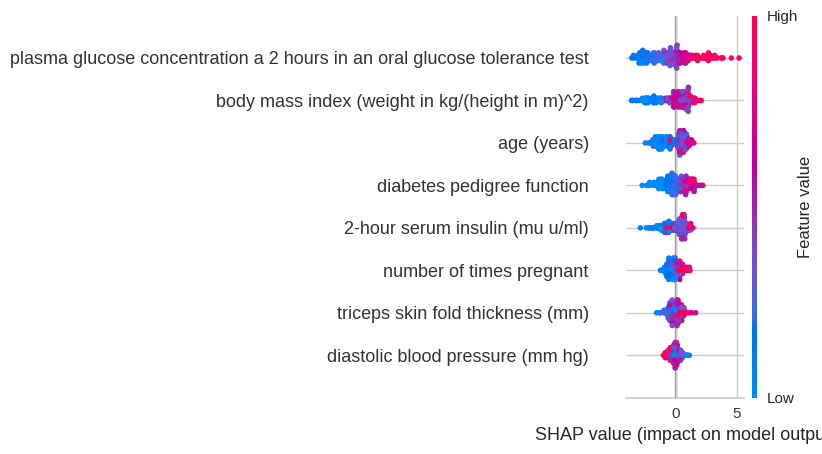

In [ ]:
interpret_model(lightgbm)